***

# 1. SDSS Spatial Distribution - FVR

***

The goal of this exercises is to perform a basic analysis using observational data, do some plots with the data and interpret the results based on the physical properties of different types of galaxies. For this, we will be using the most common Python libraries: Numpy, Matplotlib, Astropy, h5py, etc. 

The file "SDSS-LS-data.hdf5" contains data from the Sloan Digital Sky Surve Data Release 17, together with data from the Legacy Surve DR 8. In order to obtain more information about these catalogues (such as area covered by the surveys, the scientific goals they persue, the data obtained beyond what is found in the file, etc, you can go to https://datalab.noirlab.edu/index.php)

The catalogue contains RA and DEC coordinates, apparent magnitudes in *g* and *r* band, galaxy/star/quasar classfication, a sort of "morphological" classification, and redshift.

In [1]:
import sys
import numpy as np
import h5py
import matplotlib.pyplot as plt
import astropy
from astropy.cosmology import FlatLambdaCDM 

import seaborn as sns
import pandas as pd

In [9]:
# Read the data:

f = h5py.File('Catalogue-SDSS-LS.hdf5','r')

class_sdss = f['class_sdss'][:]
z_d = f['z'][:]
ra_d = f['ra'][:]
dec_d = f['dec'][:]
r_mag = f['r_mag'][:]
type = f['type_ls'][:]
print(f.keys()) # Check the datasets that the file contains. 
f.close()

<KeysViewHDF5 ['class_sdss', 'dec', 'g_mag', 'r_mag', 'ra', 'type_ls', 'z']>


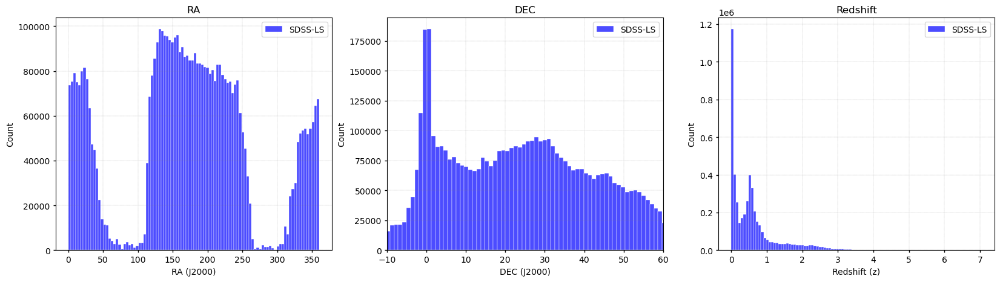

In [3]:
fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(20, 5))

ax = sns.histplot(ra_d, bins = 100, ax = axes[0], color='blue', alpha = 0.7, kde = False, edgecolor='white', label='SDSS-LS')
ax.set_title('RA', fontsize=12)
ax.tick_params(axis='both', which='both', direction='out', length=3, width=1)
ax.grid(color='gray', linestyle=':', linewidth=0.3)
ax.set_xlabel(r'RA (J2000)')
ax.legend()

ax = sns.histplot(dec_d, bins = 100, ax = axes[1], color='blue', alpha = 0.7, kde = False, edgecolor='white', label='SDSS-LS')
ax.set_title('DEC', fontsize=12)
ax.tick_params(axis='both', which='both', direction='out', length=3, width=1)
ax.grid(color='gray', linestyle=':', linewidth=0.3)
ax.set_xlabel(r'DEC (J2000)')
ax.set_xlim(-10,60)
ax.legend()

ax = sns.histplot(z, bins = 100, ax = axes[2], color='blue', alpha = 0.7, kde = False, edgecolor='white', label='SDSS-LS')
ax.set_title('Redshift', fontsize=12)
ax.tick_params(axis='both', which='both', direction='out', length=3, width=1)
ax.grid(color='gray', linestyle=':', linewidth=0.3)
ax.set_xlabel('Redshift (z)')
ax.legend()

plt.savefig('SDSS_hist.png',  bbox_inches='tight')

In [4]:
# We have to convert them in radians in order to provide coherent results:

ra = np.radians(ra_d)
dec = np.radians(dec_d)

mask = (z>0.01) & (z<0.1) & (ra>np.radians(120)) & (ra<np.radians(240))
ra_mask, dec_mask, z_mask = ra[mask], dec[mask], z[mask]

mask_dec = (np.where((dec_mask > np.radians(4)) & (dec_mask < np.radians(6))))
ra_dec, z_dec = ra_mask[mask_dec], z_mask[mask_dec]

This is an example plot for a slice of 2 degrees:

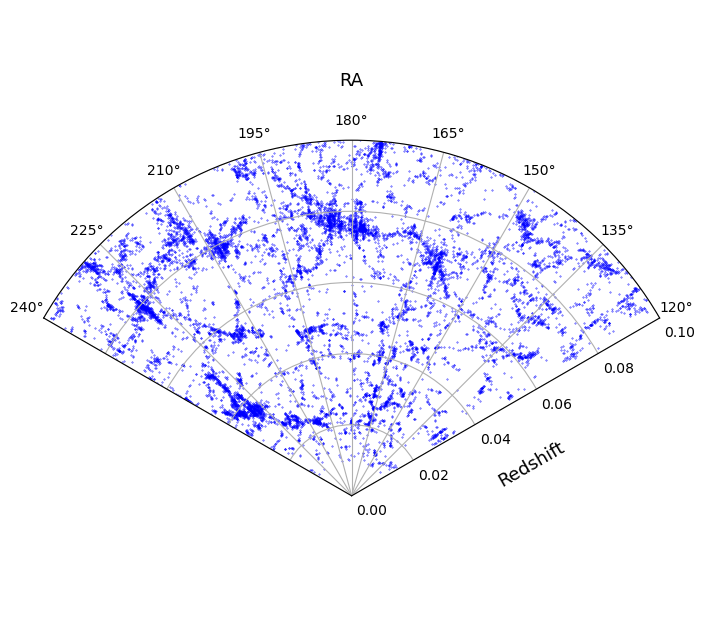

In [5]:
plt.figure(figsize=(8,8))
ax = plt.subplot(111, polar=True)

ax.scatter(ra_dec, z_dec, s=0.1, color='blue')


ax.set_xlabel('RA', size=13)
ax.xaxis.set_label_coords(0.5, 0.9)

r_label = ax.set_ylabel('Redshift', size=13, rotation=30)
ax.yaxis.set_label_coords(0.8, 0.25)

ax.set_xlim(np.radians(120), np.radians(240))
ax.set_ylim(0, 0.1)
ax.set_theta_offset(np.radians(-90))

plt.show()

Let us now implement the luminosity function instead of redshift:

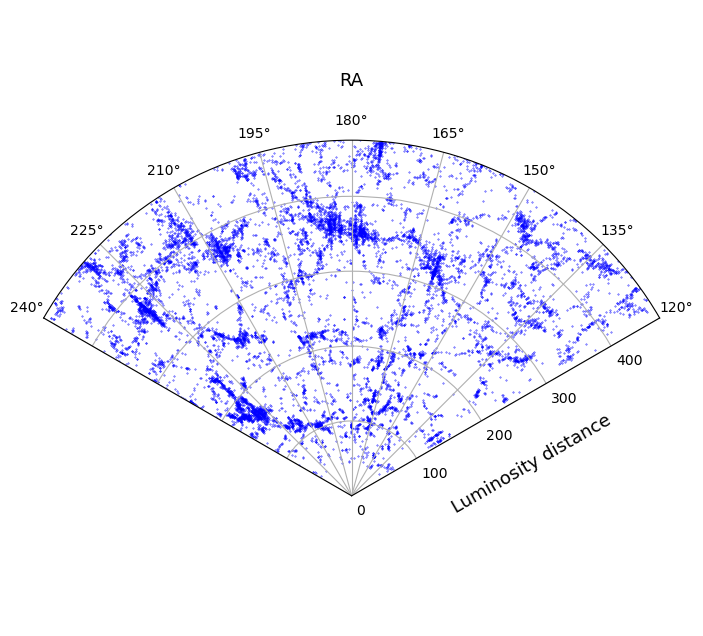

In [6]:
cosmo = FlatLambdaCDM(H0=67.77, Om0=0.3, Tcmb0=2.725)
dist_Mpc = cosmo.luminosity_distance(z_dec).to(astropy.units.pc).value/1e6 # en Mpc

plt.figure(figsize=(8,8))
ax = plt.subplot(111, polar=True)

ax.scatter(ra_dec, dist_Mpc, s=0.1, color='blue')


ax.set_xlabel('RA', size=13)
ax.xaxis.set_label_coords(0.5, 0.9)

r_label = ax.set_ylabel('Luminosity distance', size=13, rotation=30)
ax.yaxis.set_label_coords(0.8, 0.25)

ax.set_xlim(np.radians(120), np.radians(240))
ax.set_ylim(0, 475)
ax.set_theta_offset(np.radians(-90))

plt.show()

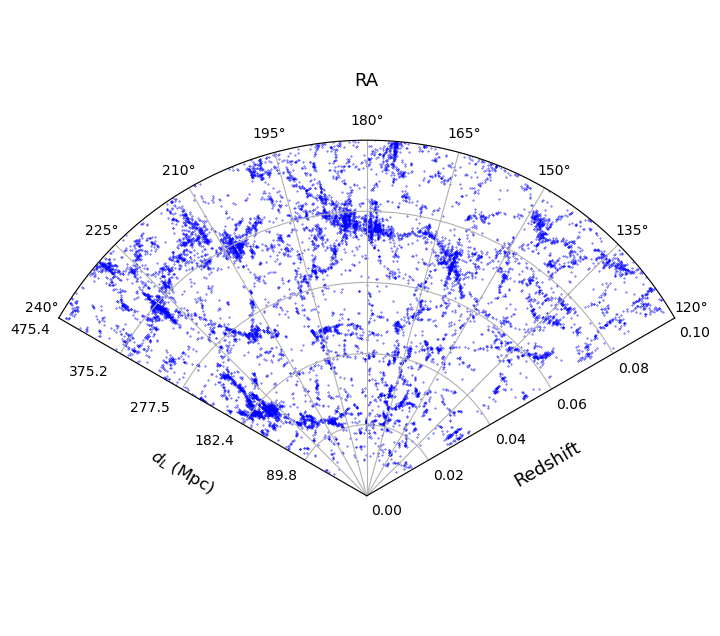

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u

cosmo = FlatLambdaCDM(H0=67.77, Om0=0.3, Tcmb0=2.725)
dist_Mpc = cosmo.luminosity_distance(z_dec).to(u.Mpc).value  # Distancia de luminosidad en Mpc

fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))

scatter = ax.scatter(ra_dec, z_dec, s=0.1, color='blue', label='Redshift')

ax.set_xlabel('RA', size=13)
ax.xaxis.set_label_coords(0.5, 0.9)
ax.set_xlim(np.radians(120), np.radians(240))
ax.set_theta_offset(np.radians(-90))
ax.set_ylim(0, 0.1)
ax.set_ylabel('Redshift', size=13, rotation=30)
ax.yaxis.set_label_coords(0.8, 0.25)


# To adjust the second label, as ax.twinx() does not work for polar plots:
redshifts = [0, 0.02, 0.04, 0.06, 0.08, 0.10]
distances = cosmo.luminosity_distance(redshifts).to(u.Mpc).value  # Distancia de luminosidad en Mpc

c=[16,8,6,4,2,0]
i=0
for dist, z in zip(distances, redshifts):
    if (z <= 0.1) & (z>0):  
        angle = np.radians(241)  
        ax.text(angle+np.radians(c[i]), z, f'{dist:.1f}', horizontalalignment='right', size=10, color='black')
        i+=1

ax.text(0.2, 0.25, r'$d_L$ (Mpc)', fontsize=12, rotation=-30,
                horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)

plt.show()

## 1.1. Distribution for different DEC and $\Delta\delta$:

Now let us plot them an arbitrary DEC range to see the dependence with the slace width:

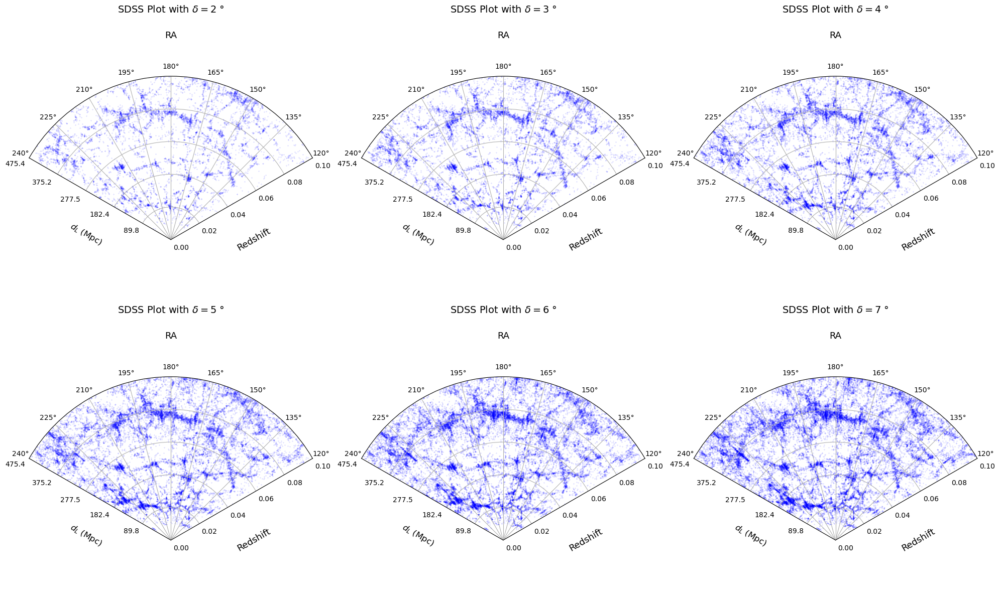

In [15]:
import numpy as np
import matplotlib.pyplot as plt

ra = np.radians(ra_d)
dec = np.radians(dec_d)
z = z_d

slices = [2,3,4,5,6,7]
def sdss_plot_slice(slices):

    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 18),  subplot_kw=dict(projection='polar'))

    for i,slice in enumerate(slices):
        
        mask = (z>0.01) & (z<0.1) & (ra>np.radians(120)) & (ra<np.radians(240))
        ra_mask, dec_mask, z_mask = ra[mask], dec[mask], z[mask]
        
        dec_min = 0
        dec_max = slice
            
        mask_dec = (dec_mask > np.radians(dec_min)) & (dec_mask < np.radians(dec_max))
        ra_dec, z_dec = ra_mask[mask_dec], z_mask[mask_dec]

        ax = axes[i // 3, i % 3]  # selección del subgráfico
        
        ax.scatter(ra_dec, z_dec, s=0.01, color='blue')
        
        ax.set_xlabel('RA', size=13)
        ax.xaxis.set_label_coords(0.5, 0.95)
        
        r_label = ax.set_ylabel('Redshift', size=13, rotation=30)
        ax.yaxis.set_label_coords(0.8, 0.2)
        
        ax.set_xlim(np.radians(120), np.radians(240))
        ax.set_ylim(0, 0.1)
        ax.set_theta_offset(np.radians(-90))

        ax.set_title(r'SDSS Plot with $\delta={}$ °'.format(slice), fontsize=14)

    
        # To adjust the second label, as ax.twinx() does not work for polar plots:
        redshifts = [0, 0.02, 0.04, 0.06, 0.08, 0.10]
        distances = cosmo.luminosity_distance(redshifts).to(u.Mpc).value  # Distancia de luminosidad en Mpc
        c=[16,8,6,4,2,0]
        i=0
        for dist, r in zip(distances, redshifts):
            if (r <= 0.1) & (r > 0):  
                angle = np.radians(241)  
                ax.text(angle+np.radians(c[i]), r, f'{dist:.1f}', horizontalalignment='right', size=10, color='black')
                i+=1
        ax.text(0.2, 0.23, r'$d_L$ (Mpc)', fontsize=12, rotation=-30, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)

    
    plt.subplots_adjust(hspace=-0.7)
    plt.savefig('SDSS_slices')
    plt.tight_layout()
    plt.show()

sdss_plot_slice(slices)

In [22]:
import numpy as np
import matplotlib.pyplot as plt

ra = np.radians(ra_d)
dec = np.radians(dec_d)

def sdss_plot(slice):
    
    mask = (z>0.01) & (z<0.1) & (ra>np.radians(120)) & (ra<np.radians(240))
    ra_mask, dec_mask, z_mask = ra[mask], dec[mask], z[mask]

    ranges = 70 // slice

    dec_min = 0
    dec_max = slice

    fig, axes = plt.subplots(nrows=(ranges - 2)//3, ncols=3, figsize=(20, 6*(ranges//3)),  subplot_kw=dict(projection='polar'))
    
    rounded_ranges = ((ranges - 2) // 3) * 3
    
    for i in range(rounded_ranges):
        
        mask_dec = (dec_mask > np.radians(dec_min)) & (dec_mask < np.radians(dec_max))
        ra_dec, z_dec = ra_mask[mask_dec], z_mask[mask_dec]

        ax = axes[i // 3, i % 3]  # selección del subgráfico
        
        ax.scatter(ra_dec, z_dec, s=0.01, color='blue')
        
        ax.set_xlabel('RA', size=13)
        ax.xaxis.set_label_coords(0.5, 0.95)
        
        r_label = ax.set_ylabel('Redshift', size=13, rotation=30)
        ax.yaxis.set_label_coords(0.8, 0.2)
        
        ax.set_xlim(np.radians(120), np.radians(240))
        ax.set_ylim(0, 0.1)
        ax.set_theta_offset(np.radians(-90))

         # Agregar título indicando el rango de declinación debajo del subgráfico
        ax.text(0.5, 0.1, 'DEC: {} - {} degrees'.format(dec_min, dec_max), fontsize=12,
                horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)

        dec_min += slice
        dec_max += slice

        # To adjust the second label, as ax.twinx() does not work for polar plots:
        redshifts = [0, 0.02, 0.04, 0.06, 0.08, 0.10]
        distances = cosmo.luminosity_distance(redshifts).to(u.Mpc).value  # Distancia de luminosidad en Mpc
        c=[16,8,6,4,2,0]
        i=0
        for dist, r in zip(distances, redshifts):
            if (r <= 0.1) & (r > 0):  
                angle = np.radians(241)  
                ax.text(angle+np.radians(c[i]), r, f'{dist:.1f}', horizontalalignment='right', size=10, color='black')
                i+=1
        ax.text(0.2, 0.23, r'$d_L$ (Mpc)', fontsize=12, rotation=-30, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)

    fig.suptitle(r'SDSS Plots with a $\delta$={} degrees changing DEC'.format(slice), fontsize=16, y=0.99)
    plt.subplots_adjust(hspace=-0.3)
    plt.savefig('SDSS_'+'{}'.format(slice)+'.png')
    plt.tight_layout()
    plt.show()

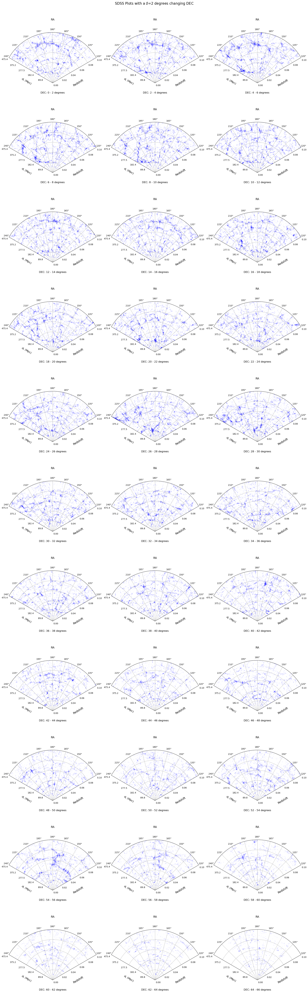

In [23]:
sdss_plot(2)

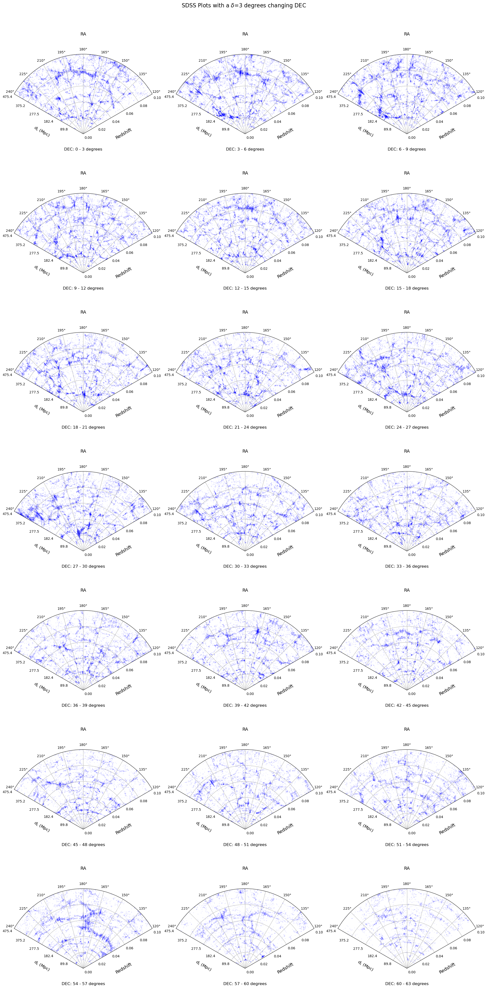

In [24]:
sdss_plot(3)

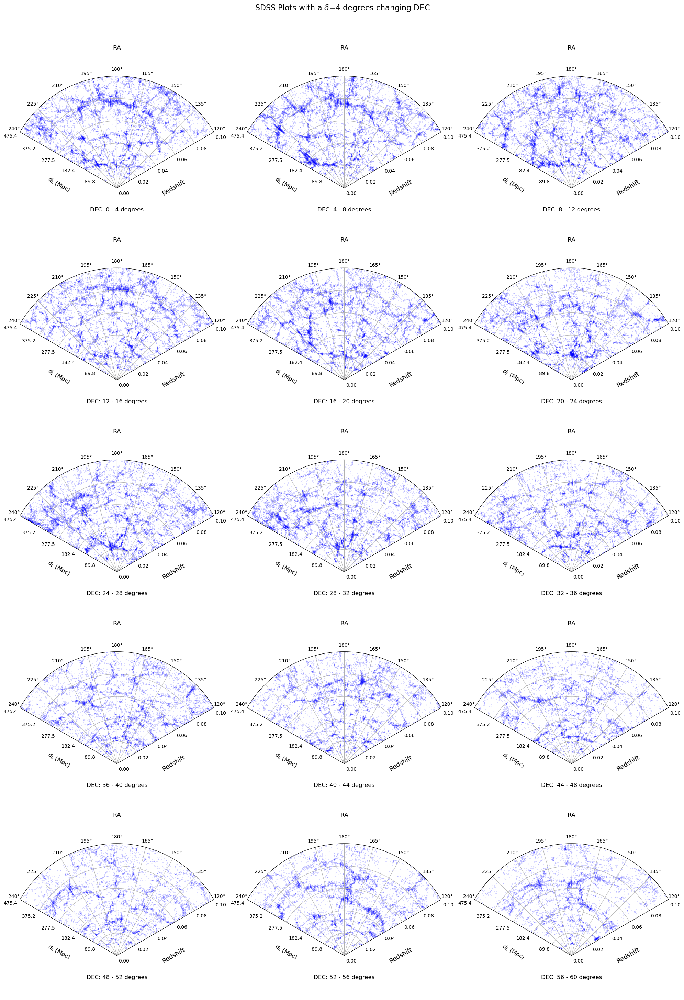

In [25]:
sdss_plot(4)

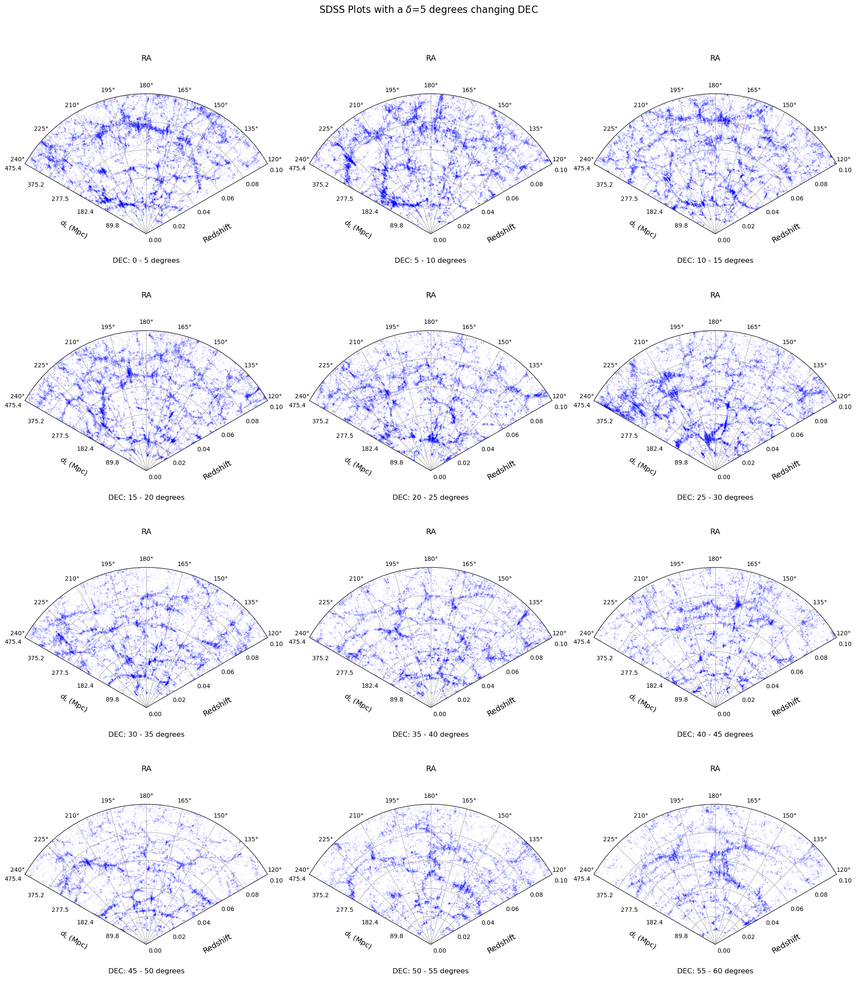

In [26]:
sdss_plot(5)

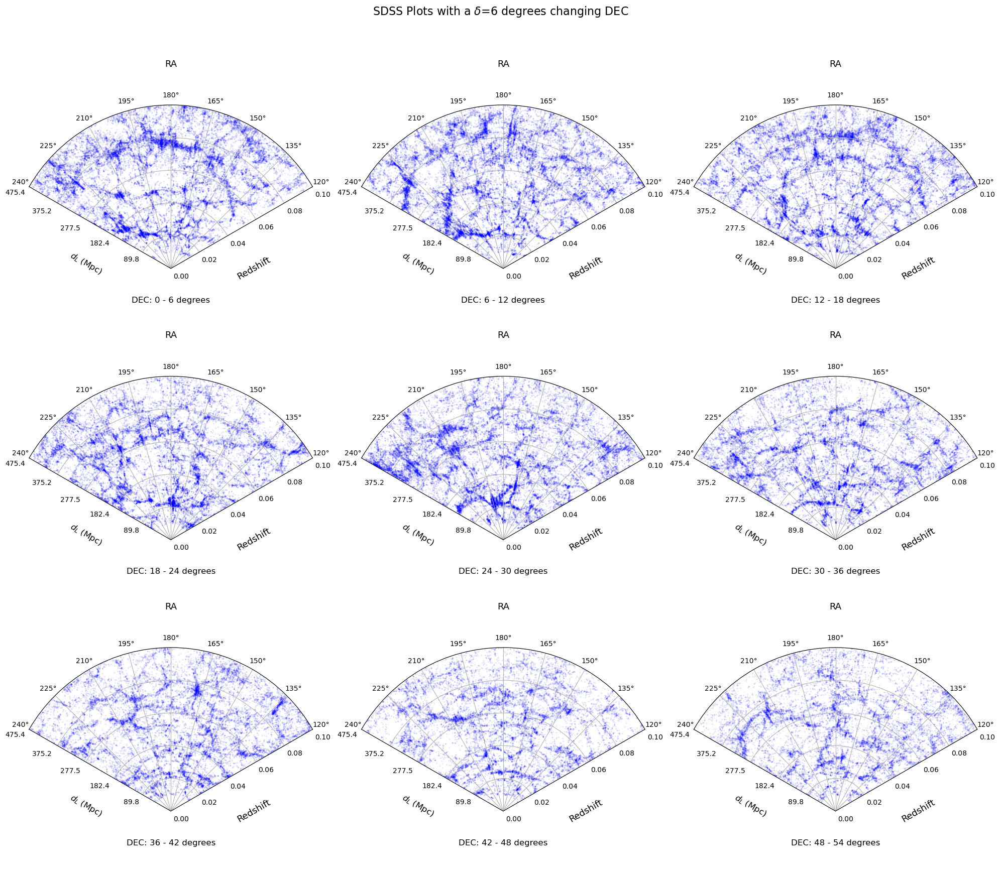

In [27]:
sdss_plot(6)

## 1.2. Distribution for different limits on $r_{mag}$:

Now we can take a random range od declination, for example between 0 and 5 degrees (DEC), and study its distribution with different limits in r magnitde.

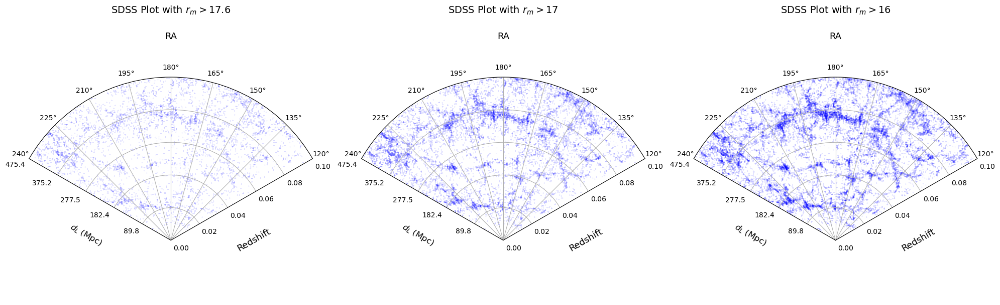

In [28]:
import numpy as np
import matplotlib.pyplot as plt


ra = np.radians(ra_d)
dec = np.radians(dec_d)

mags = [17.6, 17, 16]
def sdss_plot_mag(mags):

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 14),  subplot_kw=dict(projection='polar'))

    for i,mag in enumerate(mags):
        
        mask = (z>0.01) & (z<0.1) & (ra>np.radians(120)) & (ra<np.radians(240)) & (r_mag > mag)
        ra_mask, dec_mask, z_mask = ra[mask], dec[mask], z[mask]
        
        dec_min = 0
        dec_max = 5
            
        mask_dec = (dec_mask > np.radians(dec_min)) & (dec_mask < np.radians(dec_max))
        ra_dec, z_dec = ra_mask[mask_dec], z_mask[mask_dec]
        '''
        mask_mag = (r_mag < mag)

        ra_mag, dec_mag, z_mag= ra_dec[mask_mag], dec_mask[mask_mag], z_dec[mask_mag]
        '''
        ax = axes[i]  # selección del subgráfico
        
        ax.scatter(ra_dec, z_dec, s=0.01, color='blue')
        
        ax.set_xlabel('RA', size=13)
        ax.xaxis.set_label_coords(0.5, 0.95)
        
        r_label = ax.set_ylabel('Redshift', size=13, rotation=30)
        ax.yaxis.set_label_coords(0.8, 0.2)
        
        ax.set_xlim(np.radians(120), np.radians(240))
        ax.set_ylim(0, 0.1)
        ax.set_theta_offset(np.radians(-90))

        ax.set_title(r'SDSS Plot with $r_m>{}$'.format(mag), fontsize=14)

        # To adjust the second label, as ax.twinx() does not work for polar plots:
        redshifts = [0, 0.02, 0.04, 0.06, 0.08, 0.10]
        distances = cosmo.luminosity_distance(redshifts).to(u.Mpc).value  # Distancia de luminosidad en Mpc
        c=[16,8,6,4,2,0]
        i=0
        for dist, r in zip(distances, redshifts):
            if (r <= 0.1) & (r > 0):  
                angle = np.radians(241)  
                ax.text(angle+np.radians(c[i]), r, f'{dist:.1f}', horizontalalignment='right', size=10, color='black')
                i+=1
        ax.text(0.2, 0.23, r'$d_L$ (Mpc)', fontsize=12, rotation=-30, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)
    
    
    plt.subplots_adjust(hspace=-0.6)
    plt.savefig('SDSS_slices')
    plt.tight_layout()
    plt.show()

sdss_plot_mag(mags)

***

## Bonus: Quasar Distribution

***

We can see in the initial plots that a higher redshifts the number of sources decrease, let us plot them between 0.1 and above.

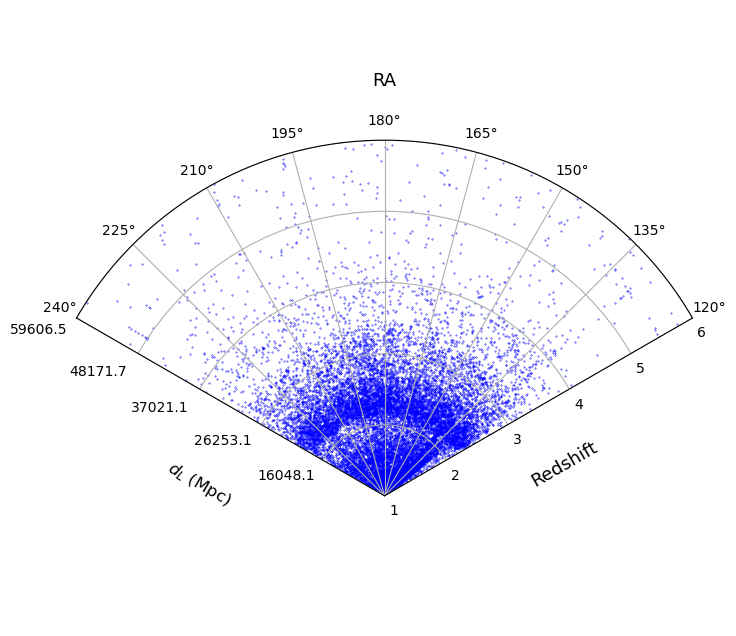

In [30]:
ra = np.radians(ra_d)
dec = np.radians(dec_d)

mask_qso = (z>1) & (z<6) & (ra>np.radians(120)) & (ra<np.radians(240))
ra_qso, dec_qso, z_qso = ra[mask_qso], dec[mask_qso], z[mask_qso]

qso_dec = (np.where((dec_qso > np.radians(0)) & (dec_qso < np.radians(5))))
ra_dec_qso, z_dec_qso = ra_qso[qso_dec], z_qso[qso_dec]

plt.figure(figsize=(8,8))
ax = plt.subplot(111, polar=True)

ax.scatter(ra_dec_qso, z_dec_qso, s=0.1, color='blue')


ax.set_xlabel('RA', size=13)
ax.xaxis.set_label_coords(0.5, 0.9)

r_label = ax.set_ylabel('Redshift', size=13, rotation=30)
ax.yaxis.set_label_coords(0.8, 0.25)

ax.set_xlim(np.radians(120), np.radians(240))
ax.set_ylim(1, 6)
ax.set_theta_offset(np.radians(-90))

# To adjust the second label, as ax.twinx() does not work for polar plots:
redshifts = [1,2,3,4,5,6]
distances = cosmo.luminosity_distance(redshifts).to(u.Mpc).value  # Distancia de luminosidad en Mpc
c=[16,8,6,4,2,0]
i=0
for dist, r in zip(distances, redshifts):
    if (r > 1): 
        angle = np.radians(241)  
        ax.text(angle+np.radians(c[i]), r, f'{dist:.1f}', horizontalalignment='right', size=10, color='black')
        i+=1
ax.text(0.2, 0.23, r'$d_L$ (Mpc)', fontsize=12, rotation=-30, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)


plt.show()

Other option is to use the class_sdss array, and select the QSO class. We can compare both results:

In [410]:
np.unique(class_sdss)

array([b'GALAXY', b'QSO', b'STAR'], dtype=object)

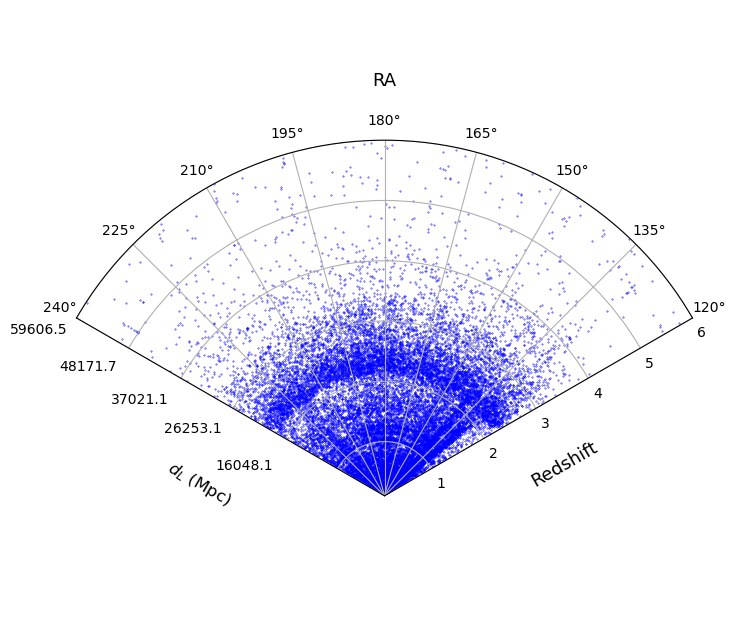

In [31]:
ra = np.radians(ra_d)
dec = np.radians(dec_d)

mask = (z>0.1) & (z<6) & (ra>np.radians(120)) & (ra<np.radians(240)) & (class_sdss == b'QSO')
ra_mask, dec_mask, z_mask = ra[mask], dec[mask], z[mask]

mask_dec = (np.where((dec_mask > np.radians(0)) & (dec_mask < np.radians(5))))
ra_dec, z_dec = ra_mask[mask_dec], z_mask[mask_dec]


plt.figure(figsize=(8,8))
ax = plt.subplot(111, polar=True)

ax.scatter(ra_dec, z_dec, s=0.1, color='blue')


ax.set_xlabel('RA', size=13)
ax.xaxis.set_label_coords(0.5, 0.9)

r_label = ax.set_ylabel('Redshift', size=13, rotation=30)
ax.yaxis.set_label_coords(0.8, 0.25)

ax.set_xlim(np.radians(120), np.radians(240))
ax.set_ylim(0.1, 6)
ax.set_theta_offset(np.radians(-90))

# To adjust the second label, as ax.twinx() does not work for polar plots:
redshifts = [1,2,3,4,5,6]
distances = cosmo.luminosity_distance(redshifts).to(u.Mpc).value  # Distancia de luminosidad en Mpc
c=[16,8,6,4,2,0]
i=0
for dist, r in zip(distances, redshifts):
    if (r > 1): 
        angle = np.radians(241)  
        ax.text(angle+np.radians(c[i]), r, f'{dist:.1f}', horizontalalignment='right', size=10, color='black')
        i+=1
ax.text(0.2, 0.23, r'$d_L$ (Mpc)', fontsize=12, rotation=-30, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)


plt.show()

***

# TNG300 - FVR

***

The IllustrisTNG simulations represent the most ambitious attempt to run with the same model of magnetohydrodynamic galaxy formation across the largest number of cosmological boxes of different sizes and particle/cell resolutions. There are currently a total of 20 simulations, across three sizes of cosmological boxes (50, 100, and 300 Mpc on a side). For each size, there are three different resolutions (e.g., TNG100-1, TNG100-2, TNG100-3), although TNG50 has an additional resolution, and all are available in Dark Matter Only and hydrodynamic versions. All of their data are in the public domain.
The physical model used is called AREPO (Springel et al. 2010), which since 2019 has also been publicly available (https://arepo-code.org/). It is an Eulerian model. Unlike Smooth Particle Hydrodynamics (SPH) models, which calculate the dynamic evolution of particles, AREPO considers space subdivided into cells, which change shape depending on resolution needs. This type of model offers several advantages when modeling gas hydrodynamics, such as better behavior in shock zones. Additionally, it is one of the first to involve magnetism in hydrodynamic equations (see, if curiosity drives you, the work of Pakmor, 2016). The best way to learn about the project in detail is to explore its website https://www.tng-project.org/, and read some of the associated papers https://www.tng-project.org/results/.

In this practice, we will work with data already extracted from the simulation, and the variable names correspond to those described in https://www.tng-project.org/data/docs/specifications/#sec2b, which must be consulted to understand what the names represent and what units they have.

The data come from the IllustrisTNG300 simulation, which has 14,485,709 galaxies distributed in a box that is 205,000 $h^{-1}$ kpc on a side

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import seaborn as sns
from matplotlib.colors import LogNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [36]:
h = 0.6774
mass_conv = 1e10

f = h5py.File('Data-TNG300.hdf5', 'r')

print(f.keys()) 
SubhaloHalfmassRadType = f['SubhaloHalfmassRadType'][:]
SubhaloMassInHalfRadType = f['SubhaloMassInHalfRadType'][:]
SubhaloMass_0 = f['SubhaloMass'][:]
SubhaloMassType = f['SubhaloMassType'][:]
# It has 6 types of particles: Gas, DM, (), Tracers, Stars & Wind, BHs
# In units of M_Sun/h
SubhaloPos = f['SubhaloPos'][:]
SubhaloSFR = f['SubhaloSFR'][:]
SubhaloSFRinHalfRad = f['SubhaloSFRinHalfRad'][:]

SubhaloStellarPhotometrics = f['SubhaloStellarPhotometrics'][:]

f.close()

r_mag_0 = SubhaloStellarPhotometrics[:, 5]
StellarMass = SubhaloMassType[:,4] * mass_conv / h
DMMass = SubhaloMassType[:,1] * mass_conv / h
SubhaloMass = SubhaloMass_0  * mass_conv / h

<KeysViewHDF5 ['SubhaloHalfmassRadType', 'SubhaloMass', 'SubhaloMassInHalfRadType', 'SubhaloMassType', 'SubhaloPos', 'SubhaloSFR', 'SubhaloSFRinHalfRad', 'SubhaloStellarPhotometrics']>


***

# Ej. 5: Color-color and color-magnitude diagrams
***
Do the color-color (u-b) vs (b-v) diagram, and color-magnitude (g-r) vs Mr diagram. Explore, using histograms, the value and ranges of the variables involved. Consider galaxies with stellar masses of $M_\star > 10^8 \, M_\odot$ (you can justify this in terms of the resolution of the simulation!). 
Later, separate galaxies in different ranges of star-formation rate and specific SFR ($SFR/M_\star$).

In [37]:
g_r = SubhaloStellarPhotometrics[:,4]-SubhaloStellarPhotometrics[:,5]
u_b = SubhaloStellarPhotometrics[:,0]-SubhaloStellarPhotometrics[:,2]
b_v = SubhaloStellarPhotometrics[:,1]-SubhaloStellarPhotometrics[:,2]

r_mag = SubhaloStellarPhotometrics[:, 5]

In [38]:
Ngal = len(r_mag)
print('Number of galaxies: {}'.format(Ngal))

mask = (r_mag>-27)&(r_mag<-15)
maskc = np.log10(StellarMass)>9.

Number of galaxies: 14485709


/tmp/ipykernel_3190378/1982970019.py:5: RuntimeWarning: divide by zero encountered in log10
  maskc = np.log10(StellarMass)>9.


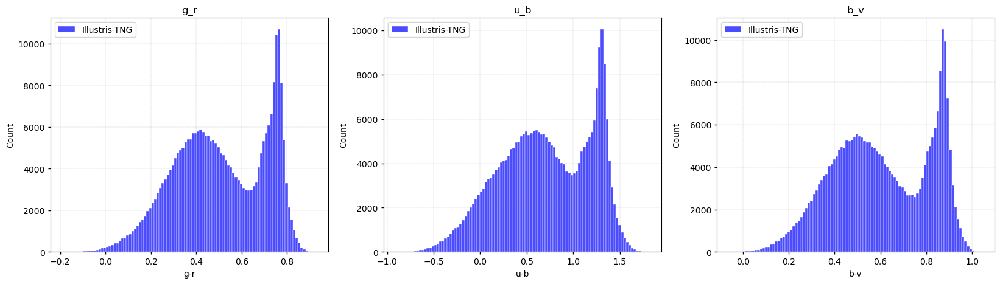

In [39]:
fig, axes = plt.subplots(nrows=1, ncols=3,figsize=(20, 5))

ax = sns.histplot(g_r[maskc], bins = 100, ax = axes[0], color='blue', alpha = 0.7, kde = False, edgecolor='white', label='Illustris-TNG')
ax.set_title('g_r', fontsize=12)
ax.tick_params(axis='both', which='both', direction='out', length=3, width=1)
ax.grid(color='gray', linestyle=':', linewidth=0.3)
ax.set_xlabel(r'g-r')
ax.legend()

ax = sns.histplot(u_b[maskc], bins = 100, ax = axes[1], color='blue', alpha = 0.7, kde = False, edgecolor='white', label='Illustris-TNG')
ax.set_title('u_b', fontsize=12)
ax.tick_params(axis='both', which='both', direction='out', length=3, width=1)
ax.grid(color='gray', linestyle=':', linewidth=0.3)
ax.set_xlabel(r'u-b')
#ax.set_xlim(-10,60)
ax.legend()

ax = sns.histplot(b_v[maskc], bins = 100, ax = axes[2], color='blue', alpha = 0.7, kde = False, edgecolor='white', label='Illustris-TNG')
ax.set_title('b_v', fontsize=12)
ax.tick_params(axis='both', which='both', direction='out', length=3, width=1)
ax.grid(color='gray', linestyle=':', linewidth=0.3)
ax.set_xlabel('b-v')
ax.legend()

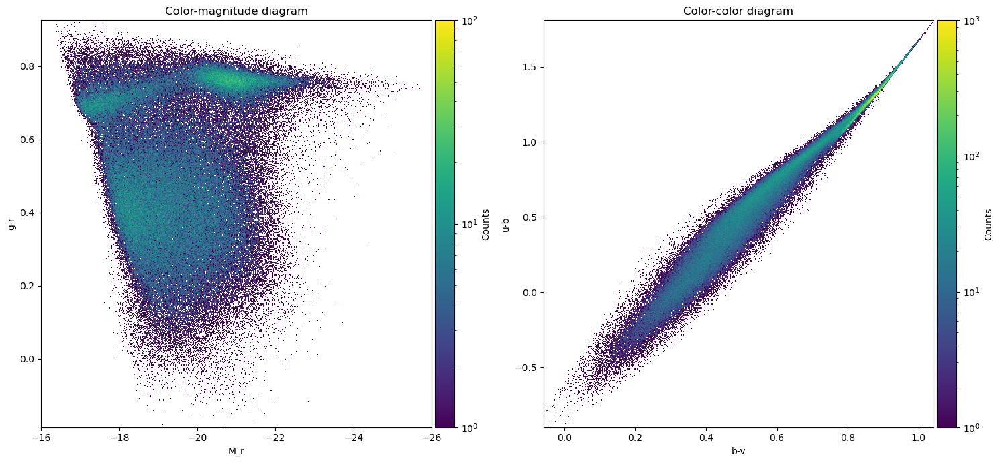

In [40]:
fig, ax = plt.subplots(1, 2, figsize=[15,7])

# Plot 1:

h_1 = ax[0].hist2d(r_mag[maskc], g_r[maskc], bins=500, cmin=1,norm=LogNorm(vmin=1, vmax=100))

divider_1 = make_axes_locatable(ax[0])
cax_1 = divider_1.append_axes("right", size="5%", pad=0.05)
cbar_1 = fig.colorbar(h_1[3], cax=cax_1, norm=LogNorm(), label='Counts')

ax[0].set_title('Color-magnitude diagram')
ax[0].set_xlabel(r'M_r')
ax[0].set_ylabel('g-r')
ax[0].set_xlim(-16, -26)


# Plot 2:

log_bins_x = np.logspace(np.log10(10), np.log10(15), 501)  # 501 bins desde 10^1 hasta 10^1.1761
log_bins_y = np.logspace(np.log10(1e-3), np.log10(1e-1), 501)  # 501 bins desde 10^-3 hasta 10^-1

h_2 = ax[1].hist2d(b_v[maskc], u_b[maskc], bins = [500, 500], cmin=1, norm=LogNorm(vmin=1, vmax=1000))


divider_2 = make_axes_locatable(ax[1])
cax_2 = divider_2.append_axes("right", size="5%", pad=0.05)
cbar_2 = fig.colorbar(h_2[3], cax=cax_2, label='Counts')

ax[1].set_title('Color-color diagram')
ax[1].set_xlabel(r'b-v')
ax[1].set_ylabel('u-b')

plt.tight_layout()
plt.show()

/tmp/ipykernel_3190378/944111889.py:5: RuntimeWarning: divide by zero encountered in log10
  color = np.log10(SubhaloSFR[maskc])


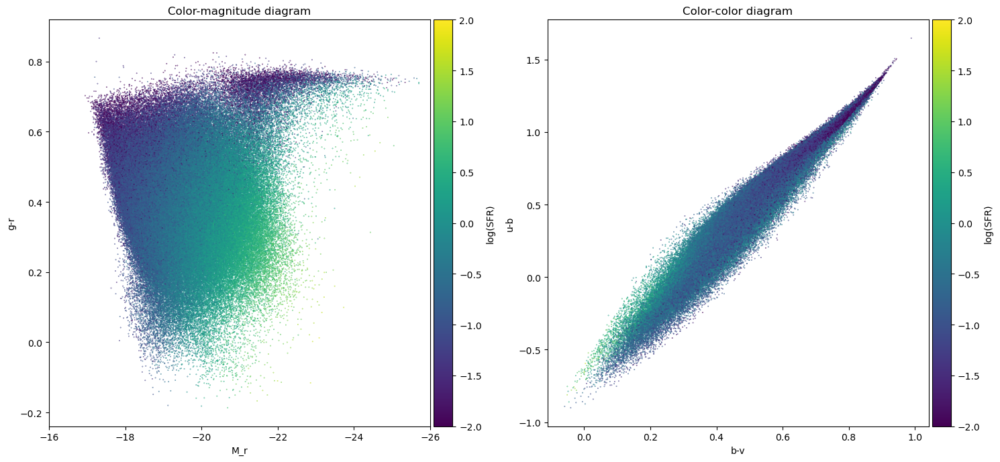

In [42]:
fig, ax = plt.subplots(1, 2, figsize=[15,7])

# Plot 1:

color = np.log10(SubhaloSFR[maskc])
h_1 = ax[0].scatter(r_mag[maskc], g_r[maskc], c=color, s=0.1, marker='o', label='Illustris-TNG', vmin=-2, vmax=2)

ax[0].set_title('Color-magnitude diagram')
ax[0].set_xlabel(r'M_r')
ax[0].set_ylabel('g-r')
ax[0].set_xlim(-16, -26)

divider_1 = make_axes_locatable(ax[0])
cax_1 = divider_1.append_axes("right", size="5%", pad=0.05)
cbar_1 = fig.colorbar(h_1, cax=cax_1, norm=LogNorm(), label='log(SFR)')



# Plot 2:

h_2 = ax[1].scatter(b_v[maskc], u_b[maskc], c=color, s=0.1, marker='o', label='Illustris-TNG', vmin=-2, vmax=2)


divider_2 = make_axes_locatable(ax[1])
cax_2 = divider_2.append_axes("right", size="5%", pad=0.05)
cbar_2 = fig.colorbar(h_2, cax=cax_2, label='log(SFR)')

ax[1].set_title('Color-color diagram')
ax[1].set_xlabel(r'b-v')
ax[1].set_ylabel('u-b')

plt.tight_layout()
plt.show()

/tmp/ipykernel_3190378/3080855543.py:5: RuntimeWarning: divide by zero encountered in log10
  color = np.log10(SubhaloSFR[maskc]/StellarMass[maskc])


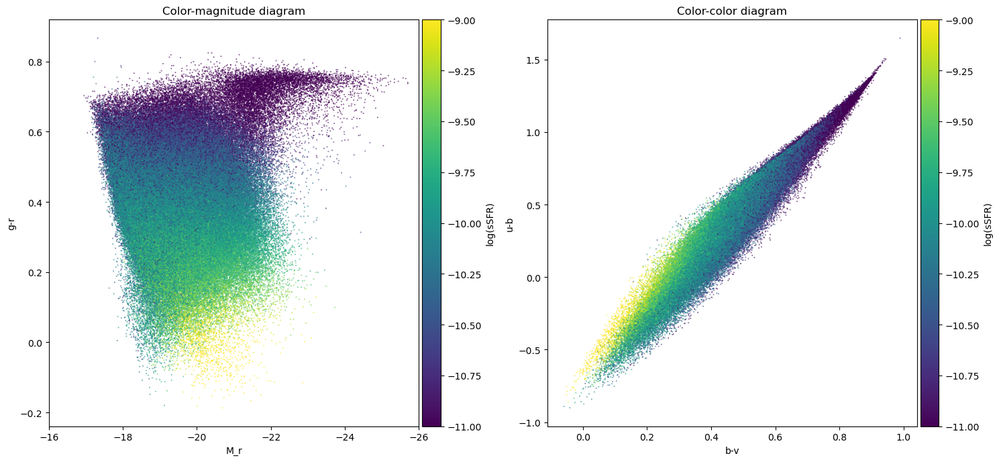

In [43]:
fig, ax = plt.subplots(1, 2, figsize=[15,7])

# Plot 1:

color = np.log10(SubhaloSFR[maskc]/StellarMass[maskc])
h_1 = ax[0].scatter(r_mag[maskc], g_r[maskc], c=color, s=0.1, marker='o', label='Illustris-TNG', vmin=-11, vmax=-9)


ax[0].set_title('Color-magnitude diagram')
ax[0].set_xlabel(r'M_r')
ax[0].set_ylabel('g-r')
ax[0].set_xlim(-16, -26)

divider_1 = make_axes_locatable(ax[0])
cax_1 = divider_1.append_axes("right", size="5%", pad=0.05)
cbar_1 = fig.colorbar(h_1, cax=cax_1, norm=LogNorm(), label='log(sSFR)')



# Plot 2:

h_2 = ax[1].scatter(b_v[maskc], u_b[maskc], c=color, s=0.1, marker='o', label='Illustris-TNG', vmin=-11, vmax=-9)


divider_2 = make_axes_locatable(ax[1])
cax_2 = divider_2.append_axes("right", size="5%", pad=0.05)
cbar_2 = fig.colorbar(h_2, cax=cax_2, label='log(sSFR)')

ax[1].set_title('Color-color diagram')
ax[1].set_xlabel(r'b-v')
ax[1].set_ylabel('u-b')

plt.tight_layout()
plt.show()

***

# Ej. 6. TNG300 - FVR

***

The IllustrisTNG simulations represent the most ambitious attempt to run with the same model of magnetohydrodynamic galaxy formation across the largest number of cosmological boxes of different sizes and particle/cell resolutions. There are currently a total of 20 simulations, across three sizes of cosmological boxes (50, 100, and 300 Mpc on a side). For each size, there are three different resolutions (e.g., TNG100-1, TNG100-2, TNG100-3), although TNG50 has an additional resolution, and all are available in Dark Matter Only and hydrodynamic versions. All of their data are in the public domain.
The physical model used is called AREPO (Springel et al. 2010), which since 2019 has also been publicly available (https://arepo-code.org/). It is an Eulerian model. Unlike Smooth Particle Hydrodynamics (SPH) models, which calculate the dynamic evolution of particles, AREPO considers space subdivided into cells, which change shape depending on resolution needs. This type of model offers several advantages when modeling gas hydrodynamics, such as better behavior in shock zones. Additionally, it is one of the first to involve magnetism in hydrodynamic equations (see, if curiosity drives you, the work of Pakmor, 2016). The best way to learn about the project in detail is to explore its website https://www.tng-project.org/, and read some of the associated papers https://www.tng-project.org/results/.

In this practice, we will work with data already extracted from the simulation, and the variable names correspond to those described in https://www.tng-project.org/data/docs/specifications/#sec2b, which must be consulted to understand what the names represent and what units they have.

The data come from the IllustrisTNG300 simulation, which has 14,485,709 galaxies distributed in a box that is 205,000 $h^{-1}$ kpc on a side

In [140]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
import seaborn as sns
from matplotlib.colors import LogNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [362]:
h = 0.6774
mass_conv = 1e10

f = h5py.File('Data-TNG300.hdf5', 'r')

print(f.keys()) 
SubhaloHalfmassRadType = f['SubhaloHalfmassRadType'][:]
SubhaloMassInHalfRadType = f['SubhaloMassInHalfRadType'][:]
SubhaloMass_0 = f['SubhaloMass'][:]
SubhaloMassType = f['SubhaloMassType'][:]
# It has 6 types of particles: Gas, DM, (), Tracers, Stars & Wind, BHs
# In units of M_Sun/h
SubhaloPos = f['SubhaloPos'][:]
SubhaloSFR = f['SubhaloSFR'][:]
SubhaloSFRinHalfRad = f['SubhaloSFRinHalfRad'][:]


SubhaloStellarPhotometrics = f['SubhaloStellarPhotometrics'][:]

f.close()

<KeysViewHDF5 ['SubhaloHalfmassRadType', 'SubhaloMass', 'SubhaloMassInHalfRadType', 'SubhaloMassType', 'SubhaloPos', 'SubhaloSFR', 'SubhaloSFRinHalfRad', 'SubhaloStellarPhotometrics']>


# Ej. 6. Mass-luminosity relation, and stellar mass - halo mass relation:
***
Represent the relation between stellar mass and luminosity ($M_r$), and the relation between the stellar mass content and the dark matter content of the dark matter halo.

Suggestion: use the numpy function *polyfit* to perform the line fitting..

The luminosity in absolute magnitude is given by M_r, where r is given by:

In [44]:
r_mag_0 = SubhaloStellarPhotometrics[:, 5]
StellarMass = SubhaloMassType[:,4] * mass_conv / h
DMMass = SubhaloMassType[:,1] * mass_conv / h
SubhaloMass = SubhaloMass_0  * mass_conv / h

Let's see how it looks like the r-mag distribution:

In [45]:
# There are wrong magnitudes we have to neglect:

mask = (r_mag_0<1e3)
r_mag, StellarMass_1 = r_mag_0[mask], StellarMass[mask]

### i. Stellar mass vs. luminosity:

/tmp/ipykernel_3190378/3255240146.py:6: RankWarning: Polyfit may be poorly conditioned
  m, b = np.polyfit(np.log10(StellarMass_1), r_mag, 1)


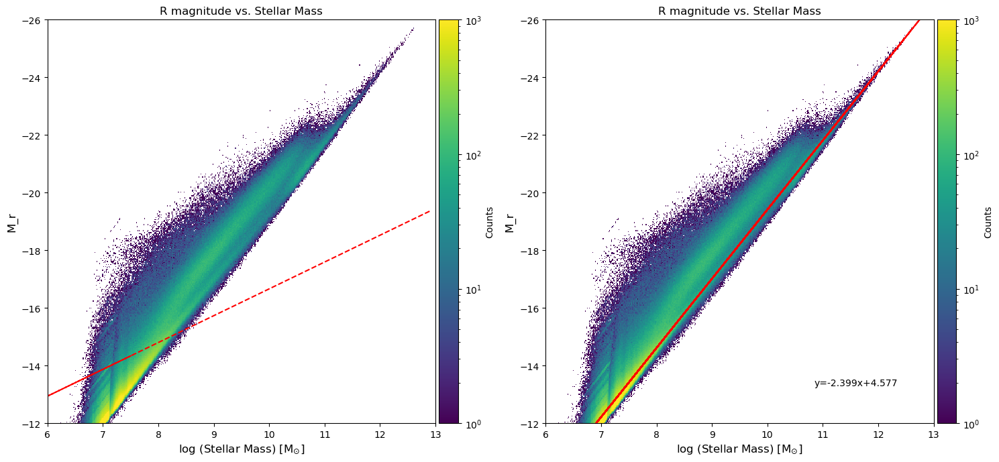

In [48]:
fig, ax = plt.subplots(1, 2, figsize=[15,7])

# Plot 1: Stellar mass vs luminosity fit:

h1 = ax[0].hist2d(np.log10(StellarMass_1), r_mag, bins=500, cmin=1, norm=LogNorm(vmin=1, vmax=1000))
m, b = np.polyfit(np.log10(StellarMass_1), r_mag, 1)
ax[0].plot(np.log10(StellarMass_1), m * np.log10(StellarMass_1) + b, color='red', linestyle='--', label='Linear fit') 

# Figure set-up:
ax[0].set_title('R magnitude vs. Stellar Mass')
ax[0].set_xlabel(r'log (Stellar Mass) [M$_{\odot}$]', fontsize=12)
ax[0].set_ylabel('M_r', fontsize=12)
ax[0].set_ylim([-12,-26])
ax[0].set_xlim([6., 13])

divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(h1[3], cax=cax, label='Counts', norm=LogNorm())

plt.subplots_adjust(hspace=0.9)

# Plot 2: Stellar mass vs luminosity fit for M > log(StellarMass)=11

log11 = (StellarMass_1 > 1e11)


h = ax[1].hist2d(np.log10(StellarMass_1), r_mag, bins = 500, cmin=1, norm=LogNorm(vmin=1, vmax=1000))
m, b = np.polyfit(np.log10(StellarMass_1[log11]), r_mag[log11], 1)
ax[1].plot(np.log10(StellarMass_1), m * np.log10(StellarMass_1) + b, color='red', linestyle='--', label='Linear fit') 


divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(h[3], cax=cax, label='Counts', norm=LogNorm())
ax[1].set_title('R magnitude vs. Stellar Mass')
ax[1].set_xlabel(r'log (Stellar Mass) [M$_{\odot}$]', fontsize=12)
ax[1].set_ylabel('M_r', fontsize=12)
ax[1].set_ylim([-12,-26])
ax[1].set_xlim([6., 13])
ax[1].text(0.8, 0.1, 'y={:.3f}x+{:.3f}'.format(m,b), fontsize=10, horizontalalignment='center', verticalalignment='center', transform=ax[1].transAxes)

plt.tight_layout()
plt.show()

/tmp/ipykernel_3190378/50763086.py:5: RuntimeWarning: divide by zero encountered in log10
  ax[0].hist2d(np.log10(DMMass), np.log10(StellarMass), range = [[9, 15], [7, 12]], bins=500, cmin=1, norm=LogNorm(vmin=1, vmax=1000))
/tmp/ipykernel_3190378/50763086.py:20: RuntimeWarning: divide by zero encountered in log10
  h = ax[1].hist2d(np.log10(DMMass), np.log10(StellarMass/DMMass), bins = [500,500], range = [[10, 15], [-3, 0]], cmin=1, norm=LogNorm(vmin=1, vmax=1000))
/tmp/ipykernel_3190378/50763086.py:20: RuntimeWarning: divide by zero encountered in divide
  h = ax[1].hist2d(np.log10(DMMass), np.log10(StellarMass/DMMass), bins = [500,500], range = [[10, 15], [-3, 0]], cmin=1, norm=LogNorm(vmin=1, vmax=1000))
/tmp/ipykernel_3190378/50763086.py:20: RuntimeWarning: invalid value encountered in divide
  h = ax[1].hist2d(np.log10(DMMass), np.log10(StellarMass/DMMass), bins = [500,500], range = [[10, 15], [-3, 0]], cmin=1, norm=LogNorm(vmin=1, vmax=1000))


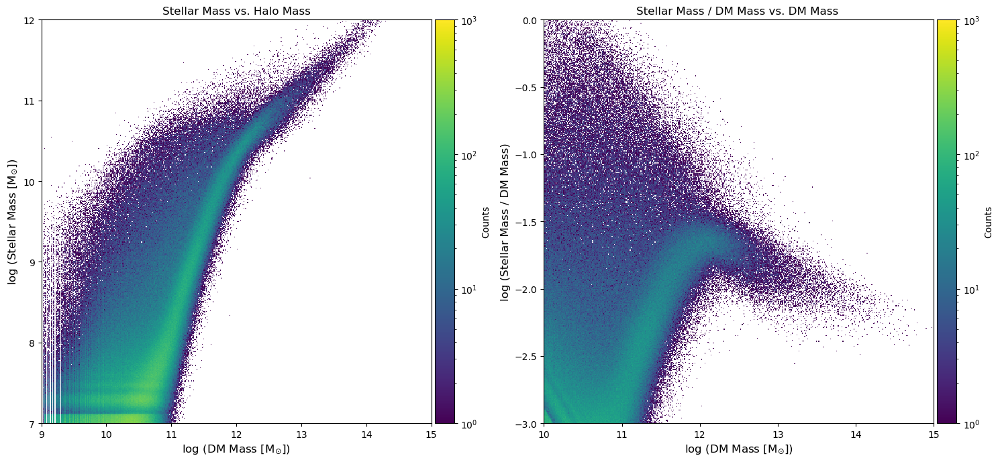

In [57]:
fig, ax = plt.subplots(1, 2, figsize=[15,7])

# Plot 1:

ax[0].hist2d(np.log10(DMMass), np.log10(StellarMass), range = [[9, 15], [7, 12]], bins=500, cmin=1, norm=LogNorm(vmin=1, vmax=1000))

divider = make_axes_locatable(ax[0])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(h[3], cax=cax, label='Counts', norm=LogNorm())

ax[0].set_title('Stellar Mass vs. Halo Mass', fontsize=12)
ax[0].set_xlabel(r'log (DM Mass [M$_{\odot}$])', fontsize=12)
ax[0].set_ylabel(r'log (Stellar Mass [M$_{\odot}$])', fontsize=12)


plt.subplots_adjust(hspace=0.3)

# Plot 2:

h = ax[1].hist2d(np.log10(DMMass), np.log10(StellarMass/DMMass), bins = [500,500], range = [[10, 15], [-3, 0]], cmin=1, norm=LogNorm(vmin=1, vmax=1000))

divider = make_axes_locatable(ax[1])
cax = divider.append_axes("right", size="5%", pad=0.05)
cbar = fig.colorbar(h[3], cax=cax, label='Counts', norm=LogNorm())

ax[1].set_title('Stellar Mass / DM Mass vs. DM Mass ', fontsize=12)
ax[1].set_xlabel(r'log (DM Mass [M$_{\odot}$])', fontsize=12)
ax[1].set_ylabel(r'log (Stellar Mass / DM Mass)', fontsize=12)

plt.tight_layout()
plt.show()

Bonus: in order to have a clearer picture of how galaxies populate the distributions, perform
a 2D histogram of the data (with pyplot) or make a contour plot to show the density of the data
(using numpy and pyplot).

***